<a href="https://www.kaggle.com/code/dannysmirnov/main-pinn-torch?scriptVersionId=129971491" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import tensorflow as tf

# Necessary libraries
import numpy as np
from datetime import datetime
from tqdm.notebook import tqdm
from scipy.interpolate import interp1d
from math import pi
from scipy.linalg import solve_banded
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.integrate import simps
import matplotlib.cm as cm
import time

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [76]:
k = 176.1 * (10**(-3))    # permeability coef
drho = 814.4     # oil-gas pressure difference
g = 9.80665      # acceleration of gravity
mu = 18.76       # dynamic viscosity
phi = 0.266      # effective porosity

alpha = k*drho*g/(mu*phi)
h_0 = 7.     # initial height
W = 150         # half of the drain length
L = 1171.3      # well length
dw = 0.089      # well diameter
zw1 = h_0*0.8
zw2 = h_0*0.75
cube_to_kg = 800  # coefficient to translate m^3 to kg
beta = 0.191794288875527
# beta = 0.8
Bo = 1.069
Bg = 0.00935
Rs = 300
gamma = 119

In [3]:
def diff_coef(z_nm, dt, dx):
    return dt * alpha * (2 * z_nm) ** (1 / 2) / (dx ** 2)


def K(y):
    return (beta - 1) * y / L + 1


def well_flow_rate(y, q0, prev_y, dy):
    delta = np.minimum(np.maximum(np.full(prev_y.shape, (2*zw1)**(1/2) - (2*prev_y)**(1/2)), 0) / dw, 1)
    ny = prev_y.shape[0]
    y_length = L * (y / (ny - 1))
    rate_in_point = (1 - delta[y] ** 2) * K(y_length)
    all_ys = np.linspace(0, L, ny)
    rate_overall = [(1 - delta[pt] ** 2) * K(y_len) for pt, y_len in enumerate(all_ys)]
    int_rate_overall = simps(y=rate_overall, dx=dy)
    if int_rate_overall <= 0:
        return 0
    return max(q0 * (rate_in_point / int_rate_overall), 0)


def psi(gnc, dy):
    all_ys = np.linspace(0, L, gnc.shape[0])
    delta = np.minimum(np.maximum((np.full(gnc.shape, zw2) - gnc), 0) / dw, 1)
    gas_diff = [(delta[pt] ** 2) * K(y_len) for pt, y_len in enumerate(all_ys)]
    oil_diff = [(1-delta[pt] ** 2) * K(y_len) for pt, y_len in enumerate(all_ys)]
    gas_rate = simps(y=gas_diff, dx=dy)
    oil_rate = simps(y=oil_diff, dx=dy)
    return gas_rate / oil_rate


def plot(sol):
    t = len(sol)
    n_x = len(sol[0]) - 1
    fig, ax = plt.subplots()
    ax.axis([0, W, (2 * zw2) ** (1 / 2) - 1, (2 * h_0) ** (1 / 2)])
    l, = ax.plot([], [], label='GOC')

    def animate(i):
        l.set_data(np.linspace(0, W, n_x + 1), sol[i])

    ani = animation.FuncAnimation(fig, animate, frames=t)
    plt.plot(np.linspace(0, W, n_x + 1), [zw2 for _ in range(n_x + 1)], label='Well bottom')
    plt.plot(np.linspace(0, W, n_x + 1), [zw1 for _ in range(n_x + 1)], label='Well top')
    plt.legend()
    plt.show()


def solve(path, nt, nx, ny):
    debits_rate = {}
    with open(path, 'r') as f:
        dat = f.read().split()
    # save gas and oil values
    days = []
    gas = []
    oil = []
    for i in range(len(dat) // 3):
        days.append(int(dat[i * 3]))
        oil.append(float(dat[i * 3 + 1]) * cube_to_kg)
        gas.append(float(dat[i * 3 + 2]))
    # interpolate oil
    debit = interp1d(days, oil, fill_value='extrapolate')
    Rs = gas[0]/oil[0]
    # to predict gas
    gas_init = gas[0]
    gas_pred = []

    dx = W / nx
    dt = max(days) / nt
    dy = L / ny

    sol = np.zeros((nt+1, nx, ny))

    # initial condition
    sol[0] = np.full((nx, ny), h_0)
    for t, curr_t in enumerate(tqdm(np.linspace(0, int(max(days)), nt))):
        for y, curr_y in enumerate(np.linspace(0, L, ny)):
            A = np.zeros((nx, nx))
            b = np.zeros(nx)
            # left boundary condition

            q_o = well_flow_rate(y, debit(curr_t), sol[t][0][:], dy) / (2 * alpha * phi)
            debits_rate[(curr_t, curr_y)] = q_o

            b[0] = -sol[t][1][y] + diff_coef(sol[t][1][y], dt, dx) * (q_o * dx) / (alpha * phi)
            A[0][1] = - (1 - 2 * diff_coef(sol[t][1][y], dt, dx))
            A[0][0] = -2 * diff_coef(sol[t][1][y], dt, dx)

            # finite diff scheme
            for i in range(1, nx - 1):
                b[i] = -sol[t][i][y]
                A[i][i - 1] = diff_coef(sol[t][i][y], dt, dx)
                A[i][i] = -1 - 2 * diff_coef(sol[t][i][y], dt, dx)
                A[i][i + 1] = diff_coef(sol[t][i][y], dt, dx)

            # right boundary condition
            b[nx - 1] = -sol[t][nx - 2][y]
            A[nx - 1][nx - 2] = -(1 - 2 * diff_coef(sol[t][nx - 1][y], dt, dx))
            A[nx - 1][nx - 1] = -2 * diff_coef(sol[t][nx - 1][y], dt, dx)

            # x = tridiagonal_solution(A, b)

            Ab = np.zeros((3, nx))
            Ab[0, 1:] = A.diagonal(1)
            Ab[1, :] = A.diagonal()
            Ab[2, :-1] = A.diagonal(-1)
            x = solve_banded((1, 1), Ab, b)

            sol[t + 1, :, y] = x

        # overall_volume.append(simps(simps(sol[t] - zw2, axis=0, dx=dx), axis=0, dx=dy))

        # counting gas
        psi_coef = psi(sol[t, 0, :], dy)
        Qg = debit(curr_t)/cube_to_kg * (psi_coef*gamma/Bg + Rs/Bo)
        qg = Bg*(Qg - debit(curr_t)/(Bo*cube_to_kg))
        gas_pred.append(qg)
    return sol, debits_rate

if __name__ == '__main__':
    path = '/kaggle/input/1501-dat/1501.dat'
    nx = 50
    nt = 169
    ny = 50

    surface, well_rates = solve(path, nt, nx, ny)


  0%|          | 0/169 [00:00<?, ?it/s]

In [77]:
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
torch.manual_seed(0)

In [78]:
# Setting domain

t = torch.linspace(0, 169, nt).to(device)
x = torch.linspace(0, W, nx).to(device)
y = torch.linspace(0, L, ny).to(device)

z_min = torch.Tensor([t[0], x[0], y[0]]).to(device)
z_max = torch.Tensor([t[-1], x[-1], y[-1]]).to(device)

In [79]:
with open(path, 'r') as f:
    dat = f.read().split()
    # save gas and oil values
    days = []
    gas = []
    oil = []
    for i in range(len(dat) // 3):
        days.append(int(dat[i * 3]))
        oil.append(float(dat[i * 3 + 1]))
        gas.append(float(dat[i * 3 + 2]))
    # interpolate oil
    debit = interp1d(days, oil, fill_value='extrapolate')

In [80]:
T, X, Y = torch.meshgrid([t, x[0], y])
X_left = torch.stack([T, X, Y], axis=-1).reshape(-1, 3).to(device)
X_left = X_left.reshape(-1, 50, 3)

In [81]:
# Getting right boundary pts and values
T, X, Y = torch.meshgrid([t, x[-1], y])
X_right = torch.stack([T, X, Y], axis=-1).reshape(-1, 3).to(device)
z_right = torch.zeros(X_right.shape[0]).reshape(-1, 1).to(device)

In [82]:
# Getting initial pts and values
T, X, Y = torch.meshgrid([t[0], x, y])
X_init = torch.stack([T, X, Y], axis=-1).reshape(-1, 3).to(device)
z_init = torch.full((X_init.shape[0], ), h_0).reshape(-1, 1).to(device)

In [83]:
# Gettig inner points
n_inner = 20000
T, X, Y = torch.meshgrid([t, x, y])
X_inner = torch.stack([T, X, Y], axis=-1).reshape(-1, 3).to(device)
z_inner = torch.flatten(torch.Tensor(surface)).reshape(-1, 1).to(device)
perm = torch.randperm(X_inner.shape[0])
X_inner = X_inner[perm][:n_inner].to(device)
z_inner = z_inner[perm][:n_inner].to(device)

In [84]:
X_data = [X_left, X_right, X_init, X_inner]
z_data = [z_right, z_init, z_inner]

In [85]:
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init


device = 'cuda' if torch.cuda.is_available() else 'cpu'
class PINN(nn.Module):
    def __init__(self, num_layers, num_neurons):
        super(PINN, self).__init__()
        self.num_layers = num_layers
        self.num_neurons = num_neurons
        
        layers = []
        input_dim = 3
        output_dim = 1
        layers.append(nn.Linear(input_dim, num_neurons))
        
        initializer = nn.init.xavier_normal_
        for i in range(num_layers):
            if i != num_layers -1:
                new_layer = nn.Linear(num_neurons, num_neurons)
                initializer(new_layer.weight)
                layers.append(new_layer)
                layers.append(nn.Tanh())
            else:
                new_layer = nn.Linear(num_neurons, output_dim)
                initializer(new_layer.weight)
                layers.append(new_layer)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        # scaling
        x = 2*(x - z_min)/(z_max - z_min)-1
        
        return self.model(x)

In [115]:
net = PINN(5, 100).to(device)

In [116]:
import torch.autograd as autograd

#utils for left boundary
well_top = torch.full((nt, ny, 1), zw1).to(device)
zeros_shape = torch.zeros((nt, ny, 1)).to(device)
dw_shape = torch.full((nt, ny, 1), dw).to(device)

timesteps = X_left[:, 0, 0].reshape(-1, 1)
oil_debit_tensor = torch.Tensor(debit(timesteps.cpu())).to(device).unsqueeze(dim=2)

sequence = torch.linspace(0, L, ny)
repeated_sequence = sequence.repeat(nt, 1)
inside_k = repeated_sequence.unsqueeze(-1)

def pde(z, z_t, z_x, z_xx):
#     z = torch.maximum(z, torch.zeros_like(z))
#     return z_t, alpha*(2*z)**(1/2)*z_xx
    return z_t, alpha*(z * z_xx + z_x ** 2)
    
def loss_fn(net, X_data, z_data):
    
    X_left, X_right, X_init, X_inner = X_data
    z_right, z_init, z_inner = z_data

    X_left = X_left.to(device)
    X_right = X_right.to(device)
    X_init = X_init.to(device)
    X_inner = X_inner.to(device)
    
#     z_left = z_left.to(device)
    z_init = z_init.to(device)
    z_inner = z_inner.to(device)
    
    loss_function = torch.nn.MSELoss()
    
    # pde loss
    
    t_in, x_in, y_in = X_inner[:, 0:1].clone(), X_inner[:, 1:2].clone(), X_inner[:, 2:3].clone()
    t_in = t_in.requires_grad_()
    x_in = x_in.requires_grad_()
    
    input_inner = torch.stack([t_in, x_in, y_in], axis=-1).reshape(-1, 3)
    z = net(input_inner)
    z_t = autograd.grad(z, t_in, torch.ones([z.shape[0], 1]).to(device), create_graph=True)[0]
    z_x = autograd.grad(z, x_in, torch.ones([z.shape[0], 1]).to(device), create_graph=True)[0]
    z_xx = autograd.grad(z_x, x_in, torch.ones([z.shape[0], 1]).to(device), create_graph=True)[0]
    
    z_left_side, z_right_side = pde(z, z_t, z_x, z_xx)
    pde_loss = loss_function(z_left_side, z_right_side)
    
    # left boundary loss
    
    t_left, x_left, y_left = X_left[:, :, 0:1].clone(), X_left[:, :, 1:2].clone(), X_left[:, :,2:3]
    x_left = x_left.requires_grad_()
    input_left = torch.stack([t_left, x_left, y_left], axis=-1)

    z_left_pred = net(input_left).squeeze(dim=-1)
    # preparing debits
    delta = torch.minimum(torch.maximum(zw1 - z_left_pred, zeros_shape), dw_shape)/dw
    to_integrate = (1 - delta**2)*K(inside_k).to(device)
    squeezed_tensor = to_integrate.squeeze(dim=1)
    integral = torch.trapz(squeezed_tensor, dx=L/ny, dim=1)
    integral[integral == 0] = 1 #to prevent division by 0
    
    q_0 = oil_debit_tensor * ((1-delta**2)*K(inside_k).to(device) / integral.unsqueeze(dim=2))
    
    q_0 = 150*q_0 / (2.*alpha*phi)
    
    z_x_left = autograd.grad(z_left_pred, x_left, torch.ones(z_left_pred.shape).to(device), create_graph=True)[0]
    
    left_loss = loss_function(z_left_pred * z_x_left, q_0)
    
    
    # right boundary loss
    
    t_right, x_right, y_right = X_right[:, 0:1].clone(), X_right[:, 1:2].clone(), X_right[:, 2:3]
    x_right = x_right.requires_grad_()
    
    input_right = torch.stack([t_right, x_right, y_right], axis=-1).reshape(-1, 3)
    z_right = net(input_right)
    z_x_right = autograd.grad(z_right, x_right, torch.ones([z_right.shape[0], 1]).to(device), create_graph=True)[0]
    
    right_loss = loss_function(z_x_right, torch.zeros_like(z_x_right).to(device))
    
    
    # initial loss
    
    t_init, x_init, y_init = X_init[:, 0:1].clone(), X_init[:, 1:2].clone(), X_init[:, 2:3]
    x_init = x_init.requires_grad_()
    
    input_init = torch.stack([t_init, x_init, y_init], axis=-1).reshape(-1, 3)
    z_init_pred = net(input_init)
    
    init_loss = loss_function(z_init_pred, z_init)
    
    # lower point loss
    
    t_low, x_low, y_low = X_inner[:, 0:1].clone(), X_inner[:, 1:2].clone(), X_inner[:, 2:3].clone()
    
    input_low = torch.stack([t_low, x_low, y_low], axis=-1).reshape(-1, 3)
    z_low_pred = net(input_low)
    z_low = torch.full((z_low_pred.shape[0], ), zw1-dw).reshape(-1, 1).to(device)
    low_error_pts = torch.maximum(z_low - z_low_pred, torch.zeros_like(z_low))
    low_loss = loss_function(low_error_pts, torch.zeros_like(z_low).to(device))
    
    # high point loss
    
    t_high, x_high, y_high = X_inner[:, 0:1].clone(), X_inner[:, 1:2].clone(), X_inner[:, 2:3].clone()
    
    input_high = torch.stack([t_high, x_high, y_high], axis=-1).reshape(-1, 3)
    z_high_pred = net(input_high)
    z_high = torch.full((z_high_pred.shape[0], ), h_0).reshape(-1, 1).to(device)
    high_error_pts = torch.maximum(z_high_pred - z_high, torch.zeros_like(z_low))
    high_loss = loss_function(high_error_pts, torch.zeros_like(z_high).to(device))
    
    # inner points
    
#     t_in, x_in, y_in = X_inner[:, 0:1].clone(), X_inner[:, 1:2].clone(), X_inner[:, 2:3].clone()
    
#     input_inner = torch.stack([t_in, x_in, y_in], axis=-1).reshape(-1, 3)
#     z = net(input_inner)
    
#     inner_loss = loss_function(z, z_inner)
    
    
    loss = pde_loss + left_loss + right_loss + init_loss + low_loss + high_loss
    
    del z, z_t, z_x, z_xx, z_right, z_x_right, z_init_pred
    
    pbar.set_postfix({'Loss': float(loss),
                      'Pde': float(pde_loss),
                      'Init': float(init_loss),
                      'Left': float(left_loss),
                      'Right': float(right_loss),
                      'Low': float(low_loss),
                      'High': float(high_loss),
                      'int mean': float(torch.mean(integral))})
    
    return loss
    
    

In [117]:
t_left, x_left, y_left = X_left[:, :, 0:1].clone(), X_left[:, :, 1:2].clone(), X_left[:, :,2:3]
x_left = x_left.requires_grad_()
input_left = torch.stack([t_left, x_left, y_left], axis=-1)

z_left_pred = net(input_left).squeeze(dim=-1)
# preparing debits
delta = torch.minimum(torch.maximum(zw1 - z_left_pred, zeros_shape), dw_shape)/dw
to_integrate = (1 - delta**2)*K(inside_k).to(device)
squeezed_tensor = to_integrate.squeeze(dim=1)
integral = torch.trapz(squeezed_tensor, dx=L/ny, dim=1)
integral[integral == 0] = 1 #to prevent division by 0

q_0 = oil_debit_tensor * ((1-delta**2)*K(inside_k).to(device) / integral.unsqueeze(dim=2))

q_0 = 150*q_0 / (2.*alpha*phi)

z_x_left = autograd.grad(z_left_pred, x_left, torch.ones(z_left_pred.shape).to(device), create_graph=True)[0]

left_loss = loss_function(z_left_pred * z_x_left, q_0)

In [118]:
import torch.optim as optim
adam_opt = optim.Adam(net.parameters(), lr=0.0005)
n_adam = 500
lbfgs_opt = optim.LBFGS(net.parameters(), history_size=10, max_iter=4)
n_lbfg = 300

In [119]:
from tqdm.notebook import trange

pbar = tqdm(total=n_adam)


for epoch in range(n_adam):
    adam_opt.zero_grad()
    loss= loss_fn(net, X_data, z_data)
    loss.backward()
    adam_opt.step()
    torch.cuda.empty_cache()
    pbar.update(1)
    
pbar = tqdm(total=n_lbfg)
for epoch in range(n_lbfg):
    def closure():
        lbfgs_opt.zero_grad()
        loss = loss_fn(net, X_data, z_data)
        loss.backward()
        return loss
    lbfgs_opt.step(closure)
    pbar.update(1)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

In [120]:
t = np.linspace(0, 169, 100)
x = np.linspace(0, W, 35)
y = np.linspace(0, L, 35)

# создаем сетку из трех массивов
T, X, Y = np.meshgrid(t, x, y, indexing='ij')

X_input = np.stack([T, X, Y], axis=-1).reshape(-1, 3)

In [121]:
surf = net(torch.Tensor(X_input).to(device)).reshape(100,35,35).to('cpu').detach().numpy()

In [122]:
cone = np.concatenate([surf[:, ::-1, :], surf], axis=1)

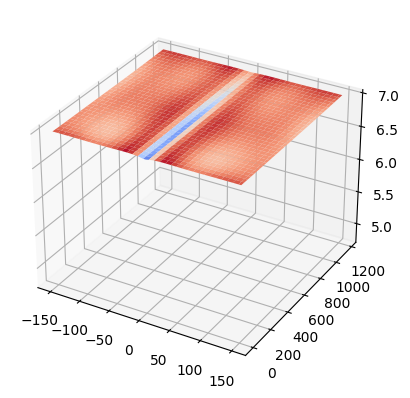

In [123]:
def update_plot(frame_number):
    ax.clear()
    ax.set_zlim(zw2 - 0.5, 7)
    z = np.swapaxes(cone[frame_number, :, :], 0, 1)
    surface_plot = ax.plot_surface(X, Y, z, cmap="coolwarm", vmin=np.min(np.abs(z)), vmax=np.max(np.abs(z)))
    surface_plot.set_facecolor((0, 0, 0, 0))
    ax.auto_scale_xyz([X.min(), X.max()], [Y.min(), Y.max()], [zw2 - 0.5, 7])
    

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

X = np.linspace(-150, 150, 2*35)
Y = np.linspace(0, L, 35)
X, Y = np.meshgrid(X, Y)

z = np.swapaxes(cone[0, :, :], 0, 1)
cmap = plt.cm.get_cmap('coolwarm')

plot = [ax.plot_surface(X, Y, z, color='0.75', rstride=1, cstride=1, cmap=cmap, vmin=np.min(np.abs(z)),
                        vmax=np.max(np.abs(z)))]
ax.set_zlim(zw2 - 0.5, 7)
ani = animation.FuncAnimation(fig, update_plot, 100, interval=100)

from IPython.display import HTML
HTML(ani.to_jshtml())